# Attention Visualization for MM-DiT Models

This notebook demonstrates how to visualize T2I (Text-to-Image) and I2T (Image-to-Text) attention maps across different MM-DiT models:
- SD3-M
- SD3.5-M
- SD3.5-L
- Flux-dev

The visualization follows Figure A14 from the paper, showing per-block and per-timestep attention.

In [1]:
import sys
sys.path.append("..")

import torch
from diffusers import StableDiffusion3Pipeline, FluxPipeline
from utils.dit_attn_viz import (
    create_attention_inspector,
    register_attention_inspector,
    inspector_callback,
    visualize_attention_grid,
    visualize_attention_single,
)

/opt/conda/envs/exp-mmdit/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Shared configuration
prompt = "a cat patting a crystal ball with the number 7 written on it in black marker."
viz_word = "cat"
num_inference_steps = 28
height, width = 1024, 1024

## SD3-M Attention Visualization

In [3]:
pipe = StableDiffusion3Pipeline.from_pretrained(
    "stabilityai/stable-diffusion-3-medium-diffusers",
    torch_dtype=torch.float16,
).to("cuda")

inspector = create_attention_inspector(
    pipe, prompt,
    num_inference_steps=num_inference_steps,
    t5_max_seq_len=256,
)
register_attention_inspector(pipe, inspector)

Loading pipeline components...: 100%|██████████| 9/9 [00:00<00:00,  9.77it/s]


100%|██████████| 28/28 [00:24<00:00,  1.16it/s]


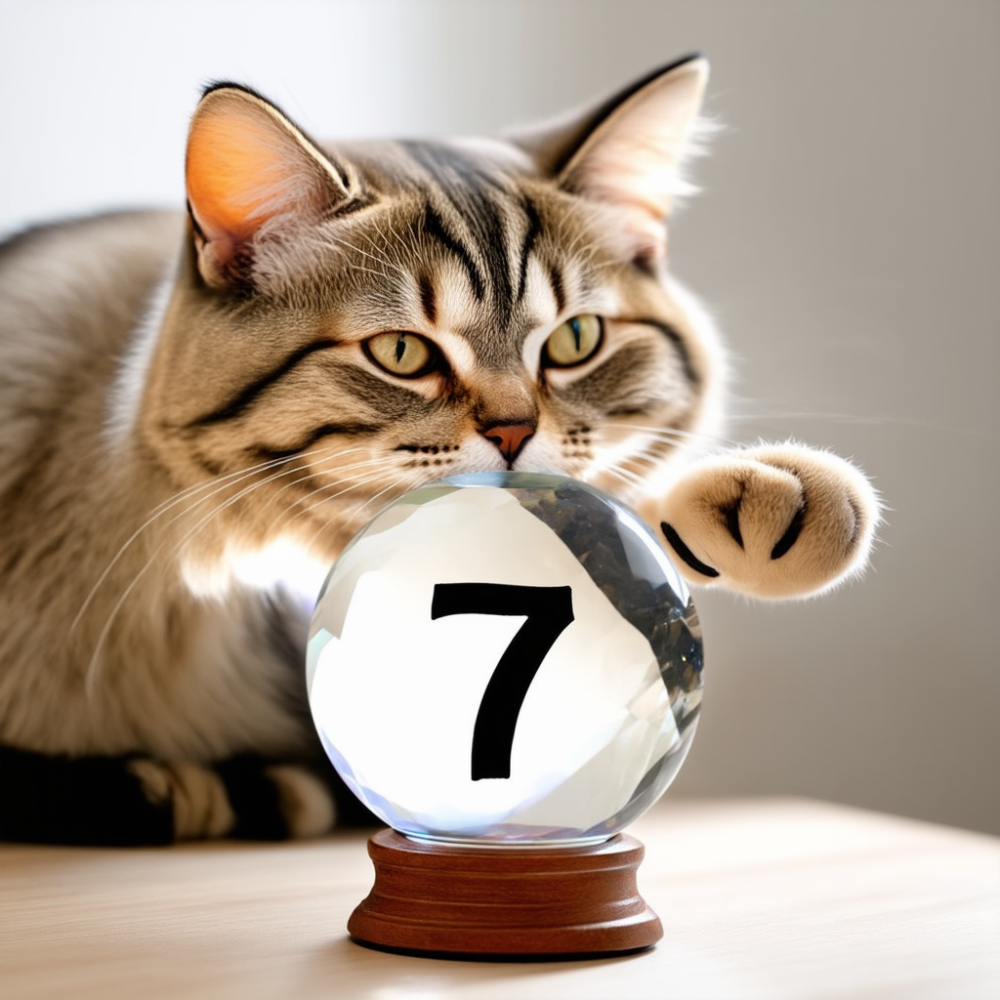

In [4]:
image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    height=height, width=width,
    max_sequence_length=256,
    generator=torch.Generator().manual_seed(864),
    callback_on_step_end=inspector_callback,
).images[0]
image

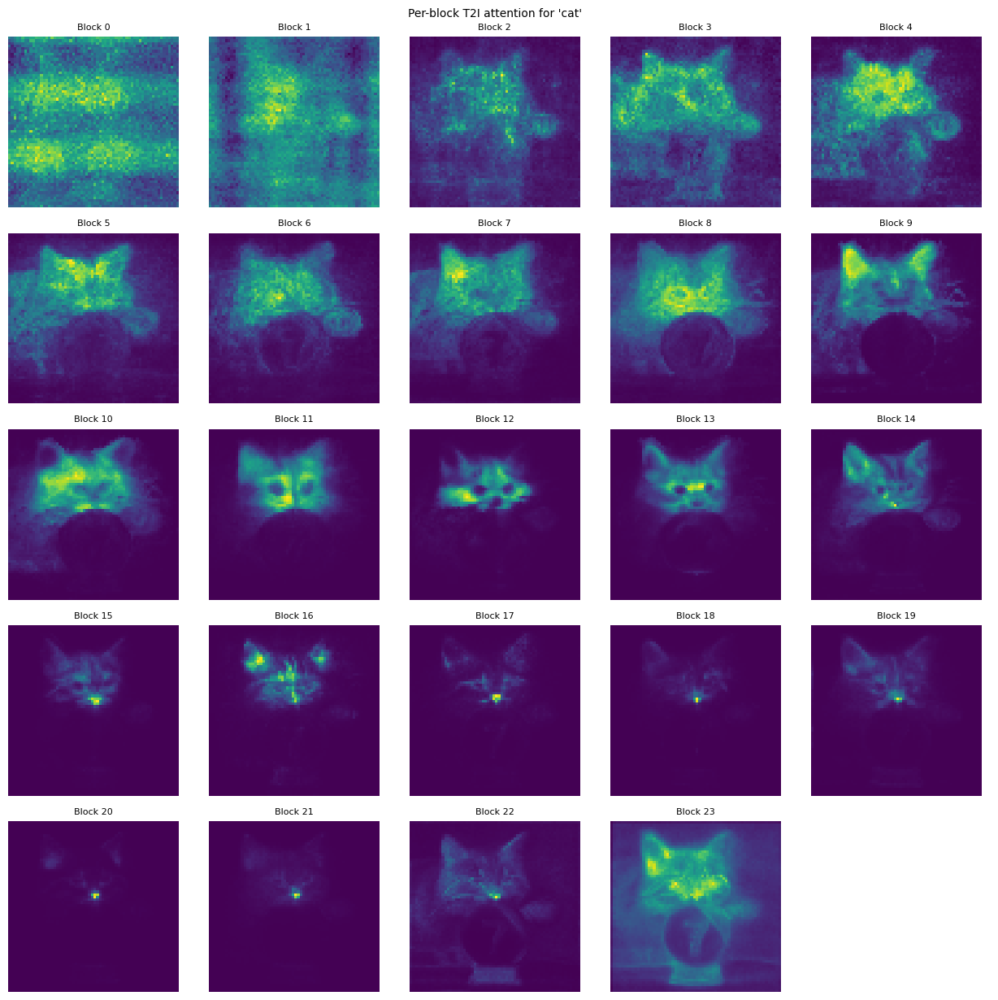

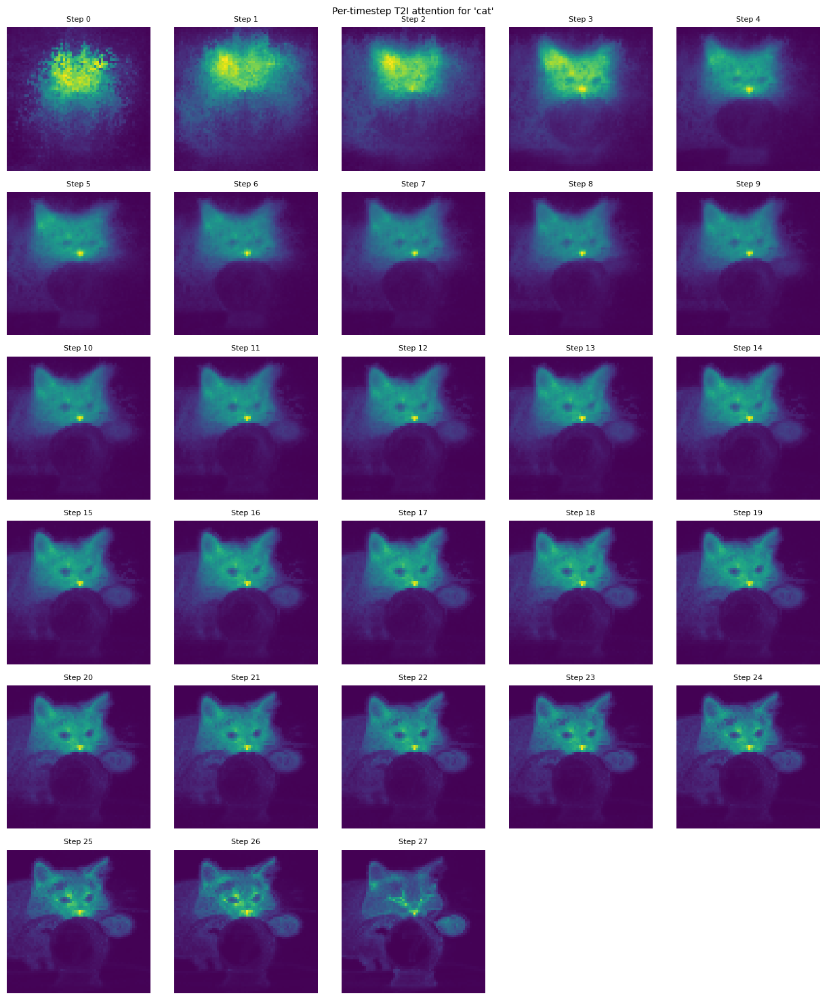

In [5]:
# T2I: how text influences image generation
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="T2I",
    image_size=(height, width),
)

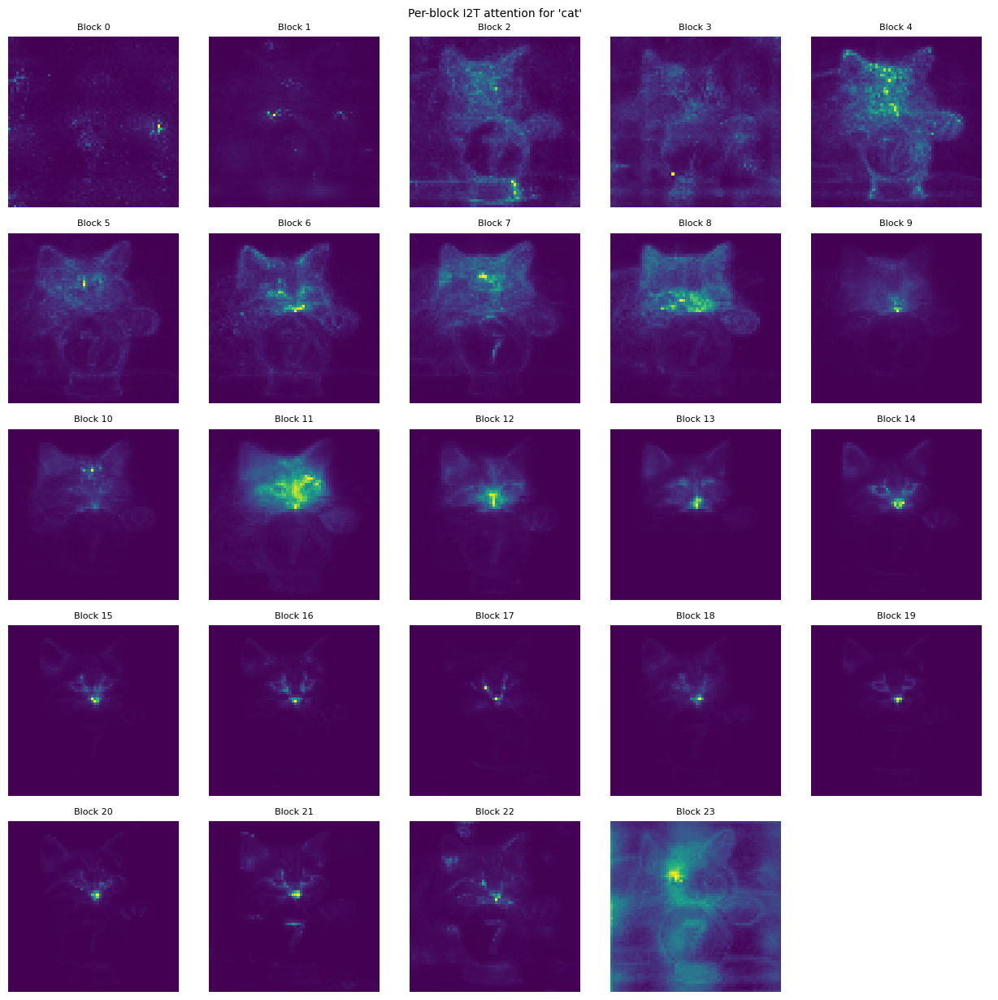

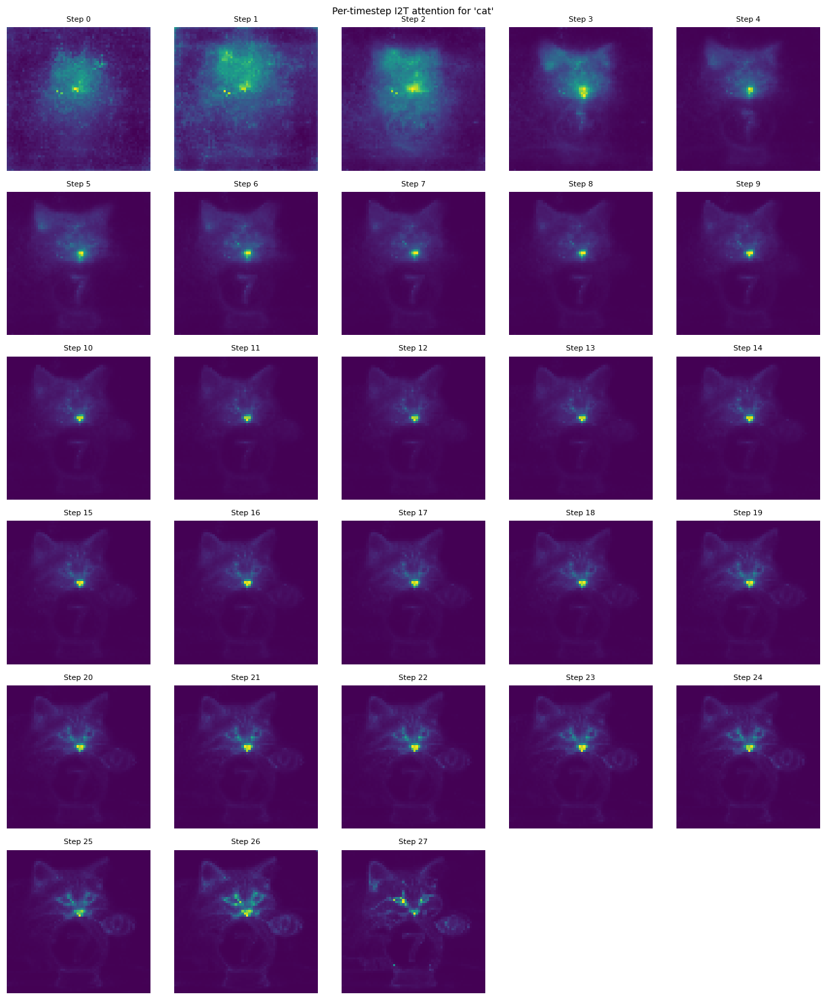

In [6]:
# I2T: how image influences text (typically weaker localization)
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="I2T",
    image_size=(height, width),
)

In [7]:
del pipe, inspector
torch.cuda.empty_cache()

## SD3.5-M Attention Visualization

In [8]:
pipe = StableDiffusion3Pipeline.from_pretrained(
    "stabilityai/stable-diffusion-3.5-medium",
    torch_dtype=torch.bfloat16,
).to("cuda")

inspector = create_attention_inspector(
    pipe, prompt,
    num_inference_steps=num_inference_steps,
    t5_max_seq_len=256,
)
register_attention_inspector(pipe, inspector)

Loading pipeline components...: 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]


100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


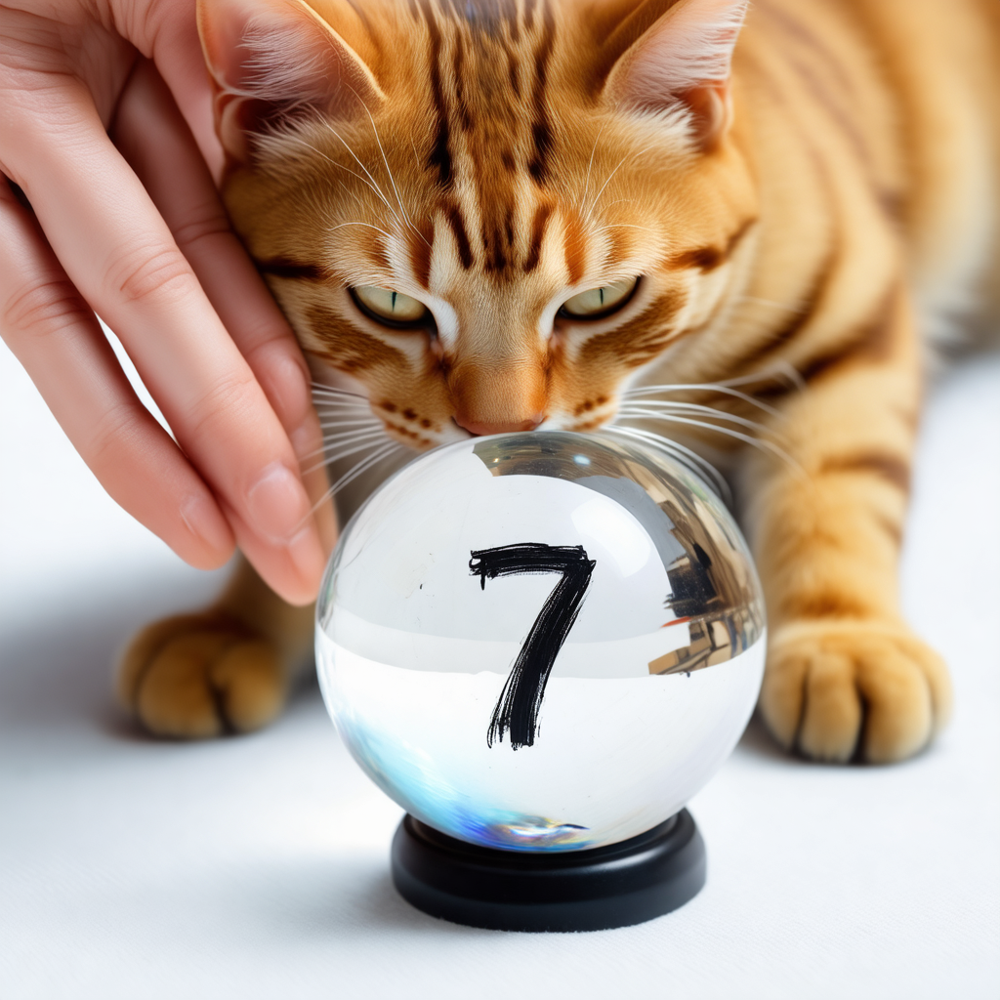

In [9]:
image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    height=height, width=width,
    max_sequence_length=256,
    generator=torch.Generator().manual_seed(864),
    callback_on_step_end=inspector_callback,
).images[0]
image

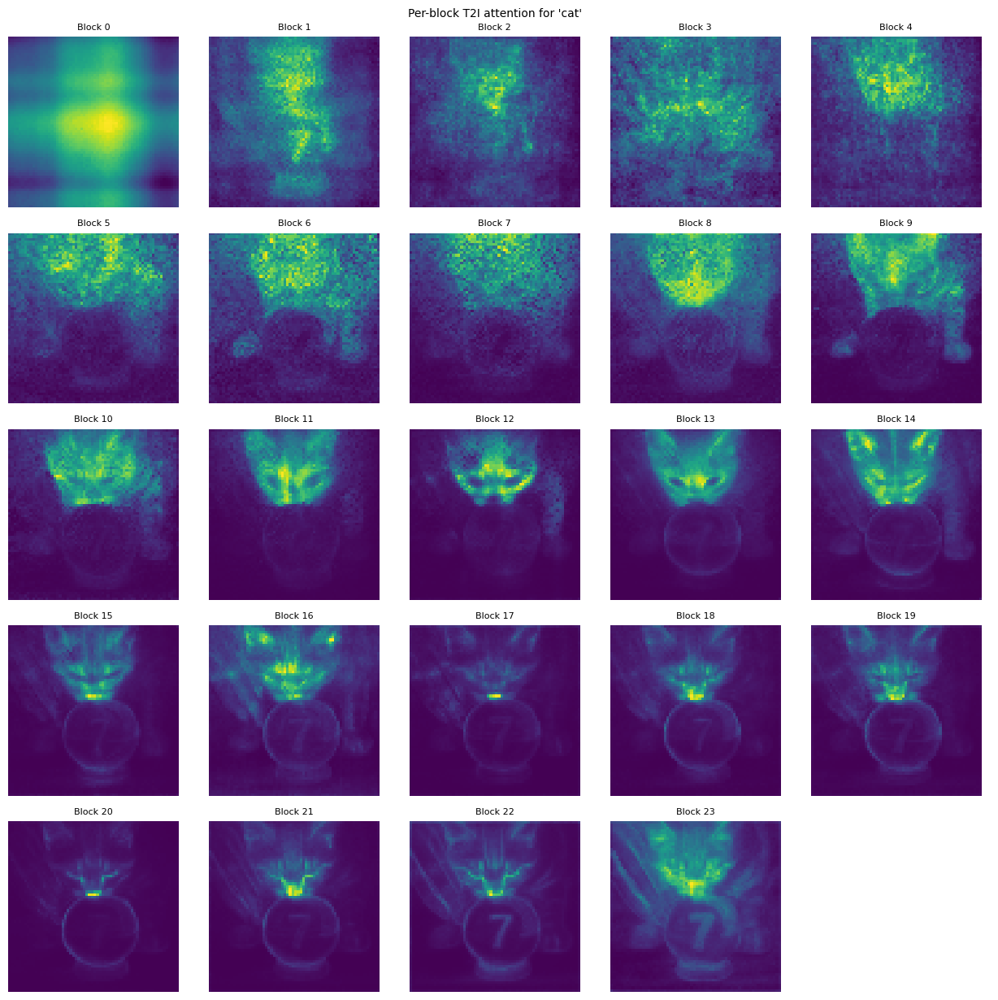

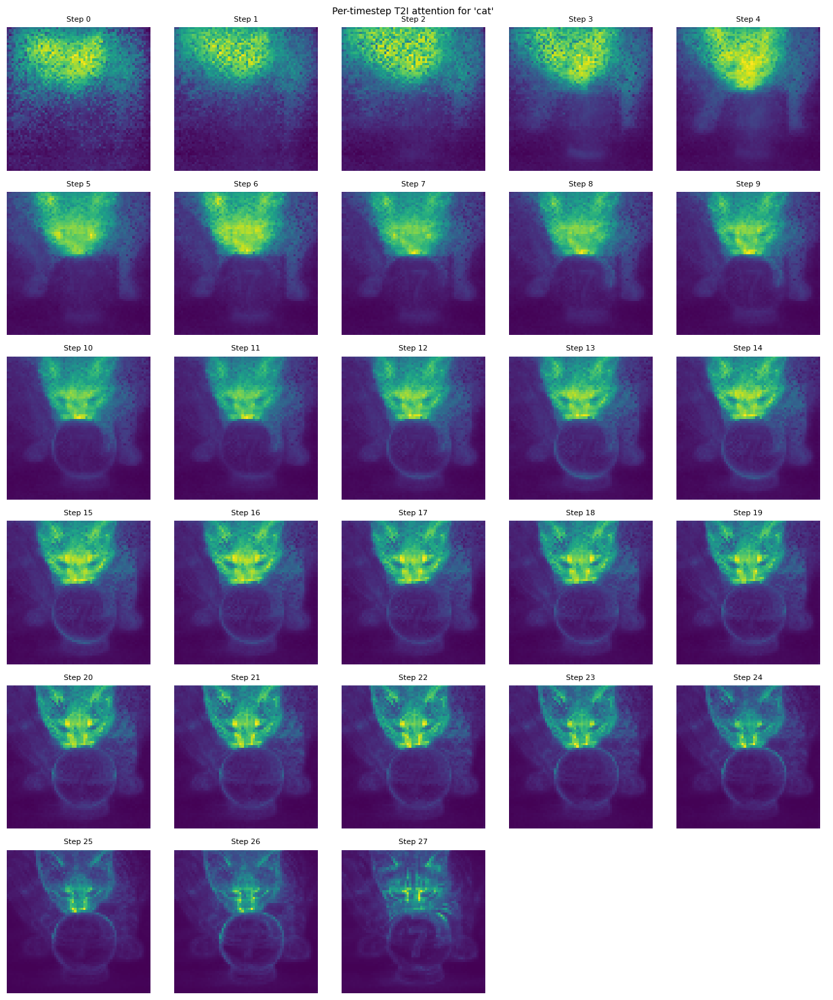

In [10]:
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="T2I",
    image_size=(height, width),
)

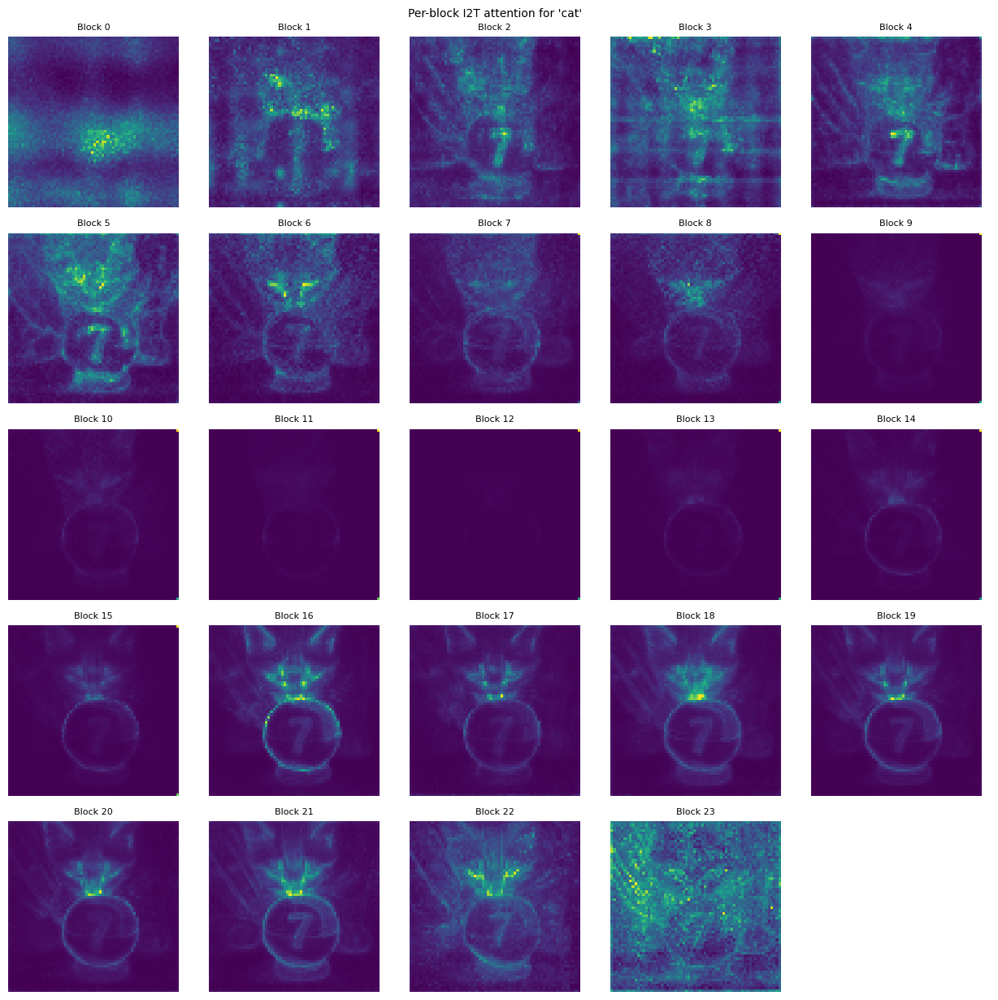

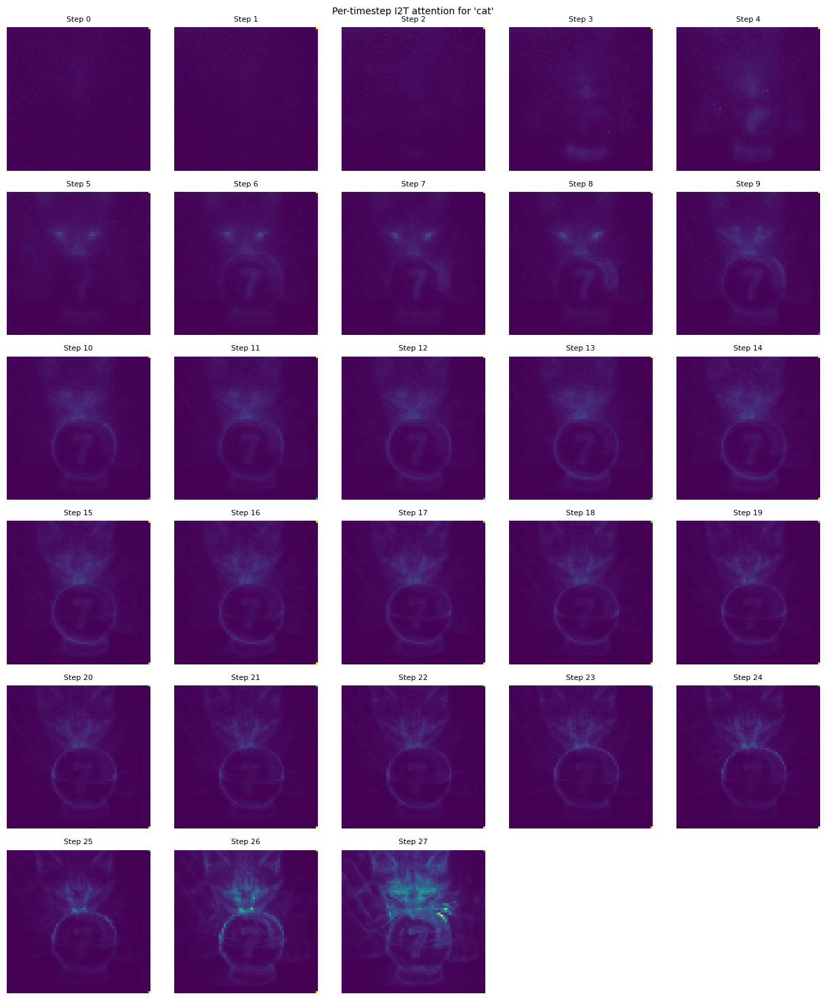

In [11]:
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="I2T",
    image_size=(height, width),
)

In [12]:
del pipe, inspector
torch.cuda.empty_cache()

## SD3.5-L Attention Visualization

In [13]:
pipe = StableDiffusion3Pipeline.from_pretrained(
    "stabilityai/stable-diffusion-3.5-large",
    torch_dtype=torch.bfloat16,
).to("cuda")

inspector = create_attention_inspector(
    pipe, prompt,
    num_inference_steps=num_inference_steps,
    t5_max_seq_len=512,
)
register_attention_inspector(pipe, inspector)

Loading pipeline components...: 100%|██████████| 9/9 [00:01<00:00,  6.29it/s]


100%|██████████| 28/28 [01:13<00:00,  2.62s/it]


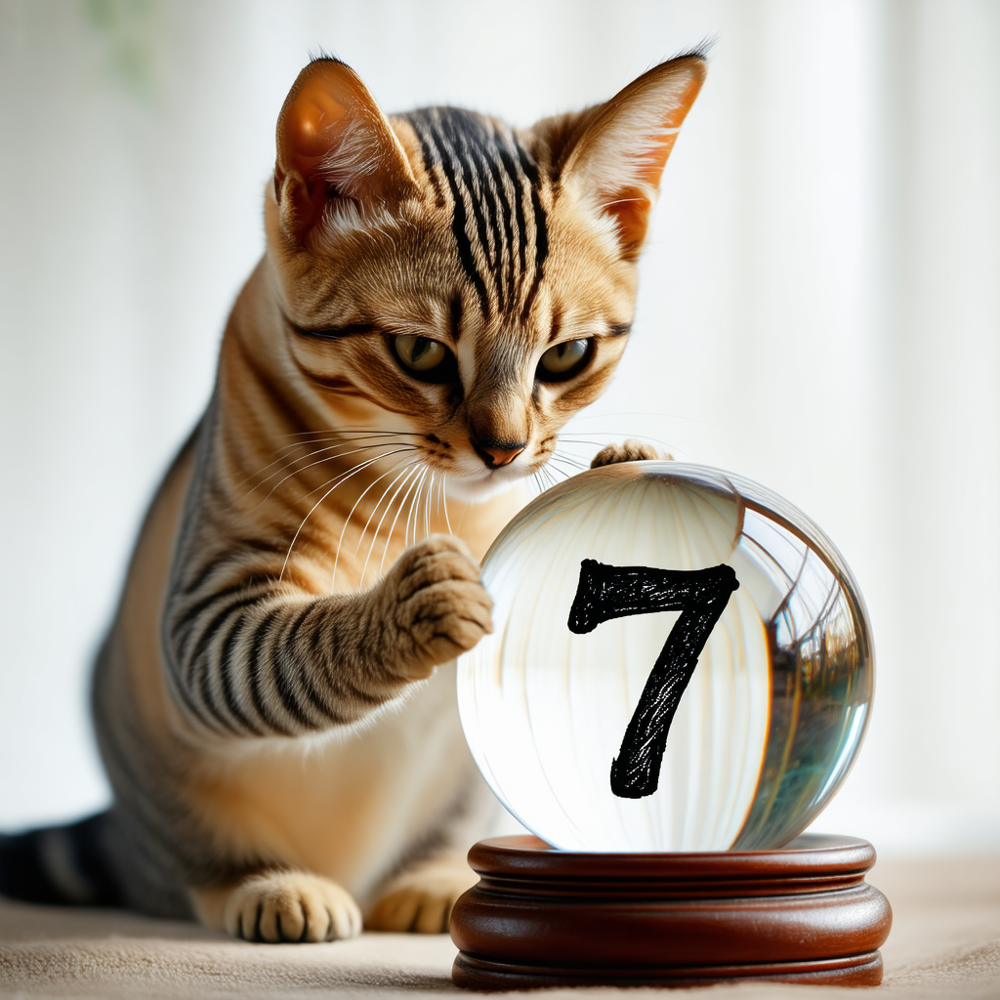

In [14]:
image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    height=height, width=width,
    max_sequence_length=512,
    generator=torch.Generator().manual_seed(864),
    callback_on_step_end=inspector_callback,
).images[0]
image

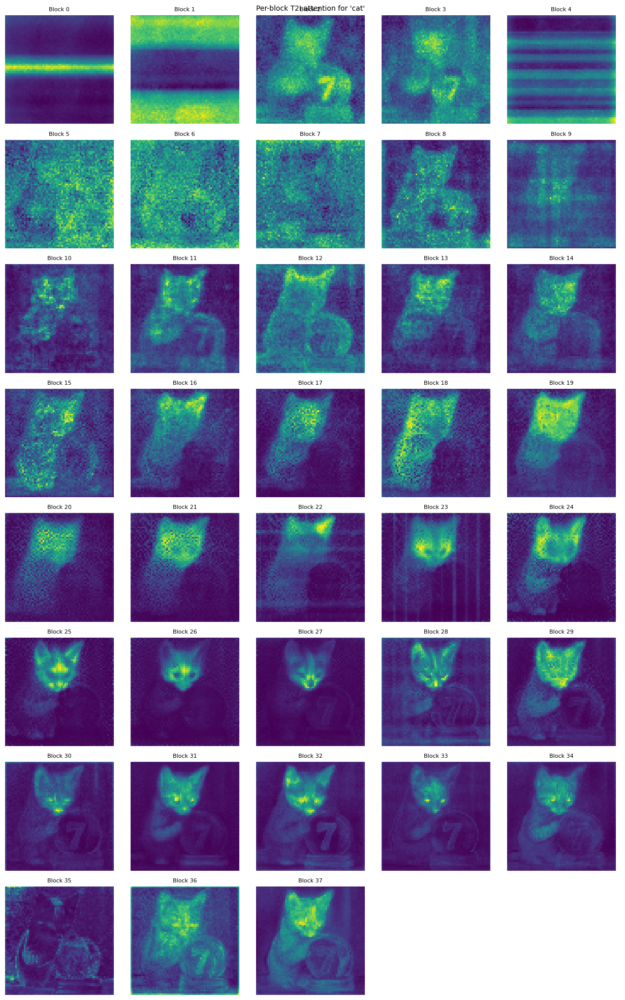

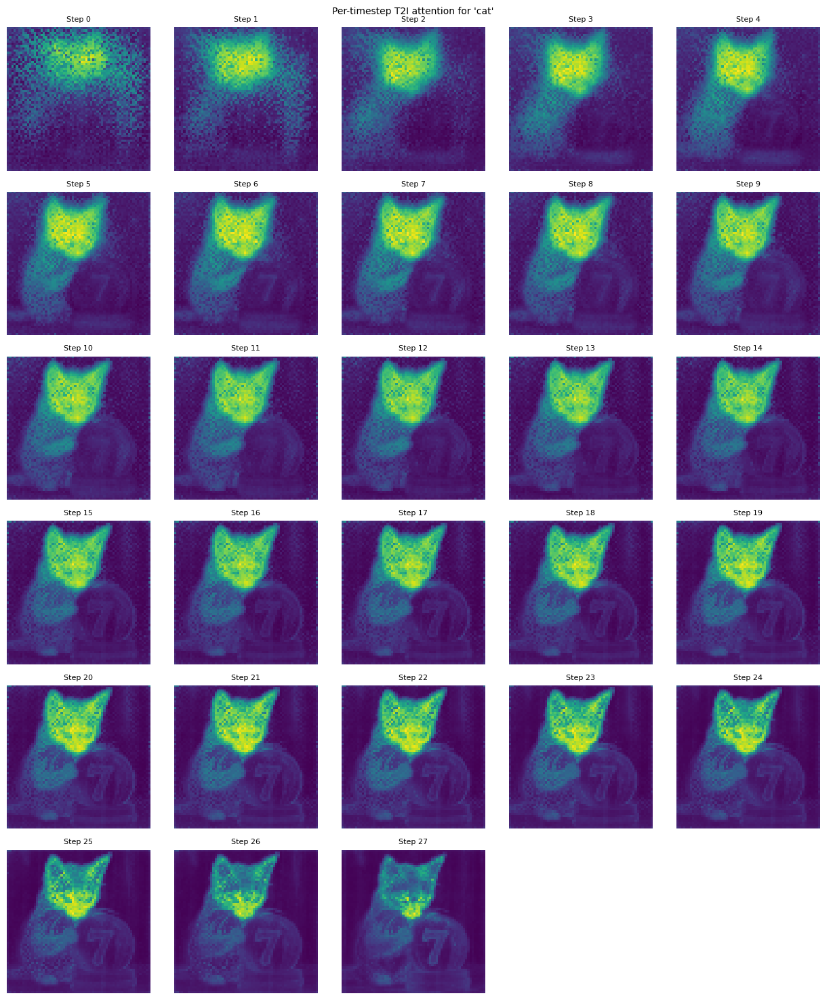

In [15]:
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="T2I",
    image_size=(height, width),
)

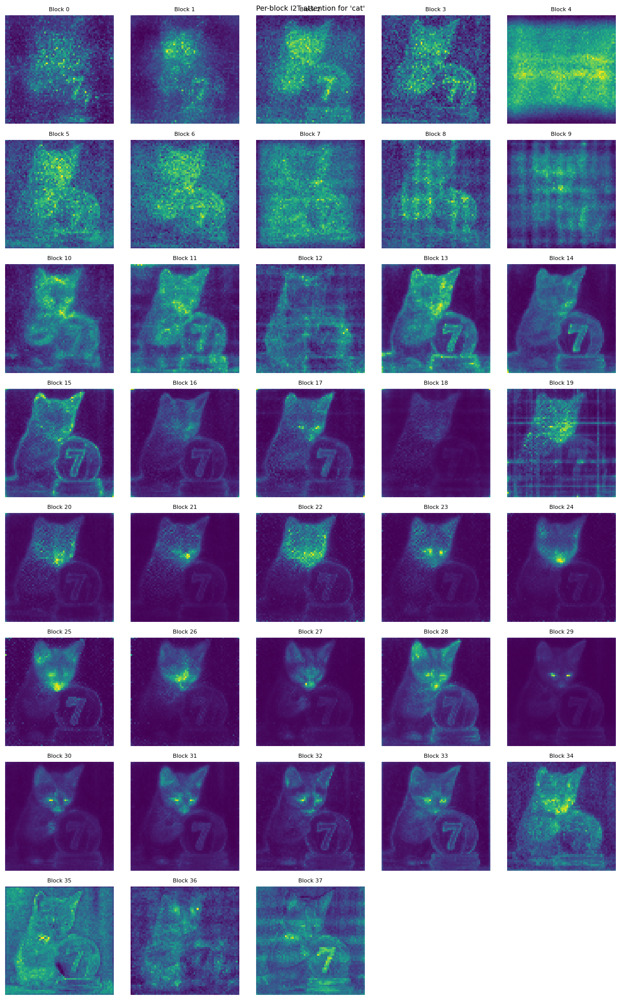

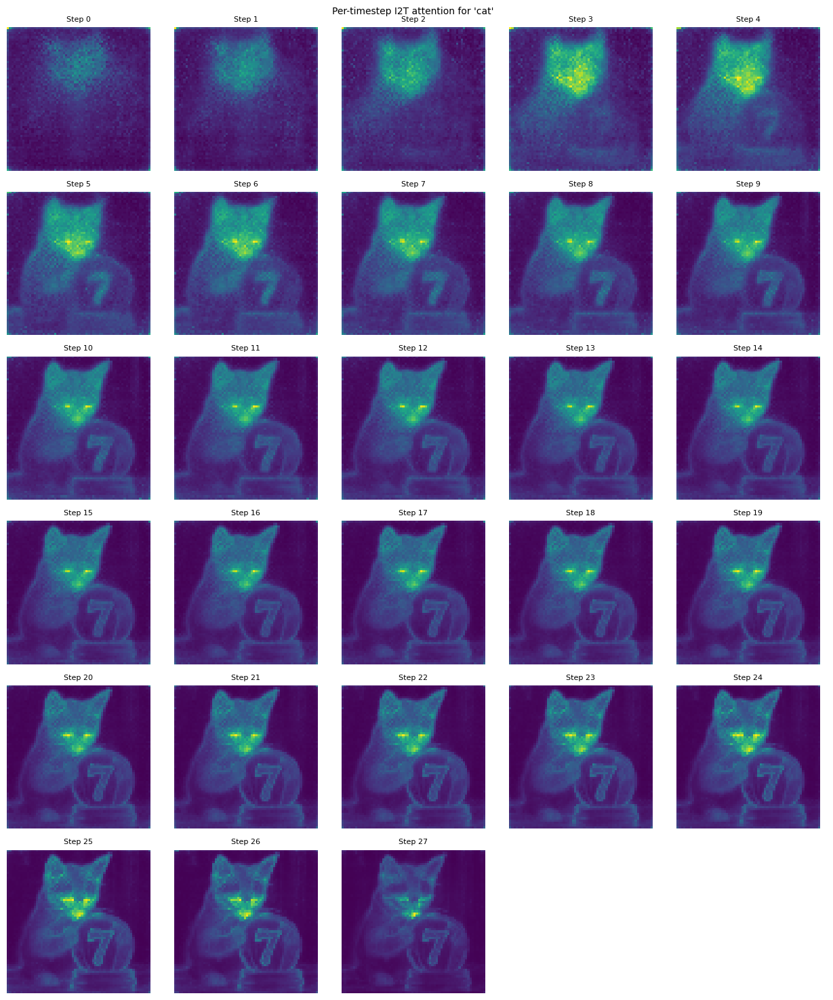

In [16]:
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="I2T",
    image_size=(height, width),
)

In [17]:
del pipe, inspector
torch.cuda.empty_cache()

## Flux-dev Attention Visualization

In [18]:
pipe = FluxPipeline.from_pretrained(
    "black-forest-labs/FLUX.1-dev",
    torch_dtype=torch.bfloat16,
).to("cuda")

inspector = create_attention_inspector(
    pipe, prompt,
    num_inference_steps=num_inference_steps,
    t5_max_seq_len=512,
)
register_attention_inspector(pipe, inspector)

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 18.00it/s]


100%|██████████| 28/28 [00:42<00:00,  1.53s/it]


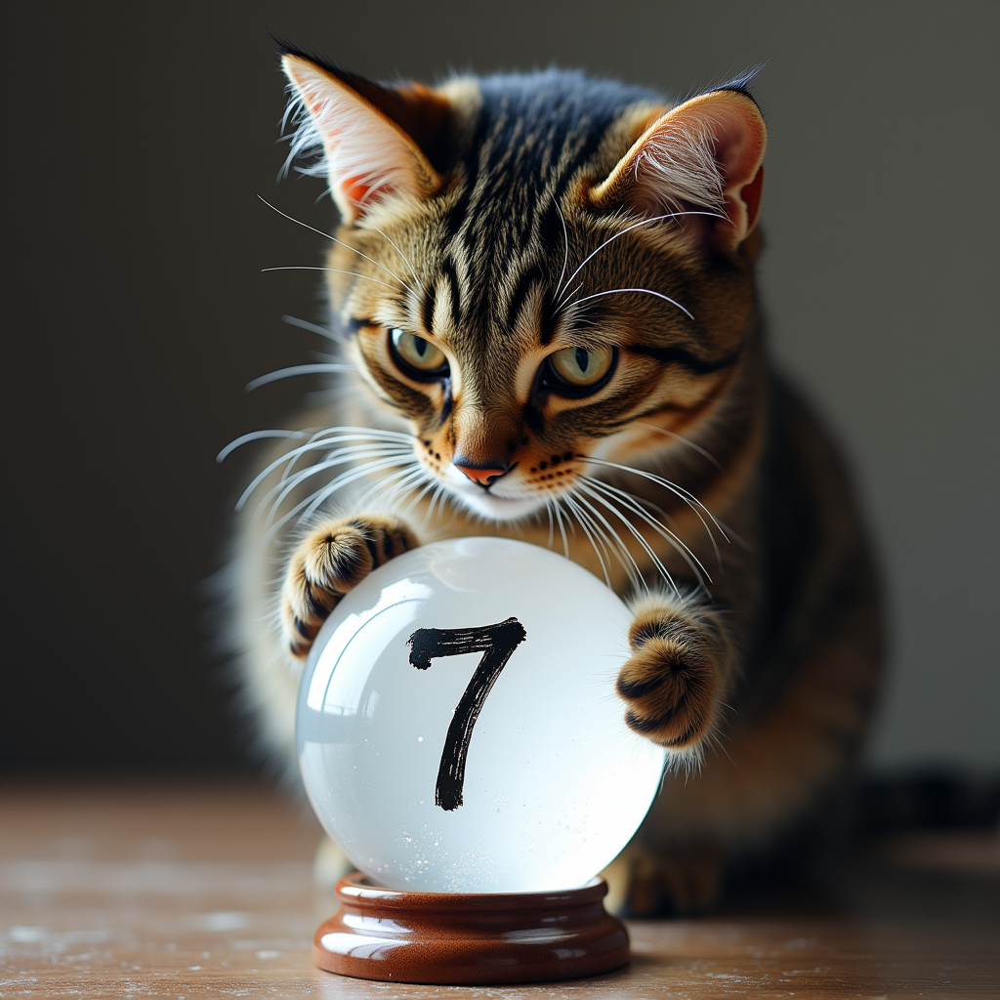

In [19]:
image = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    height=height, width=width,
    max_sequence_length=512,
    generator=torch.Generator().manual_seed(864),
    callback_on_step_end=inspector_callback,
).images[0]
image

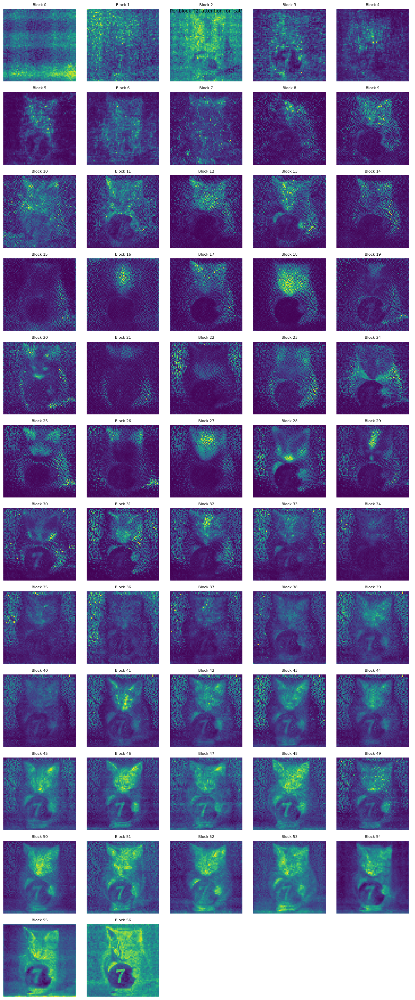

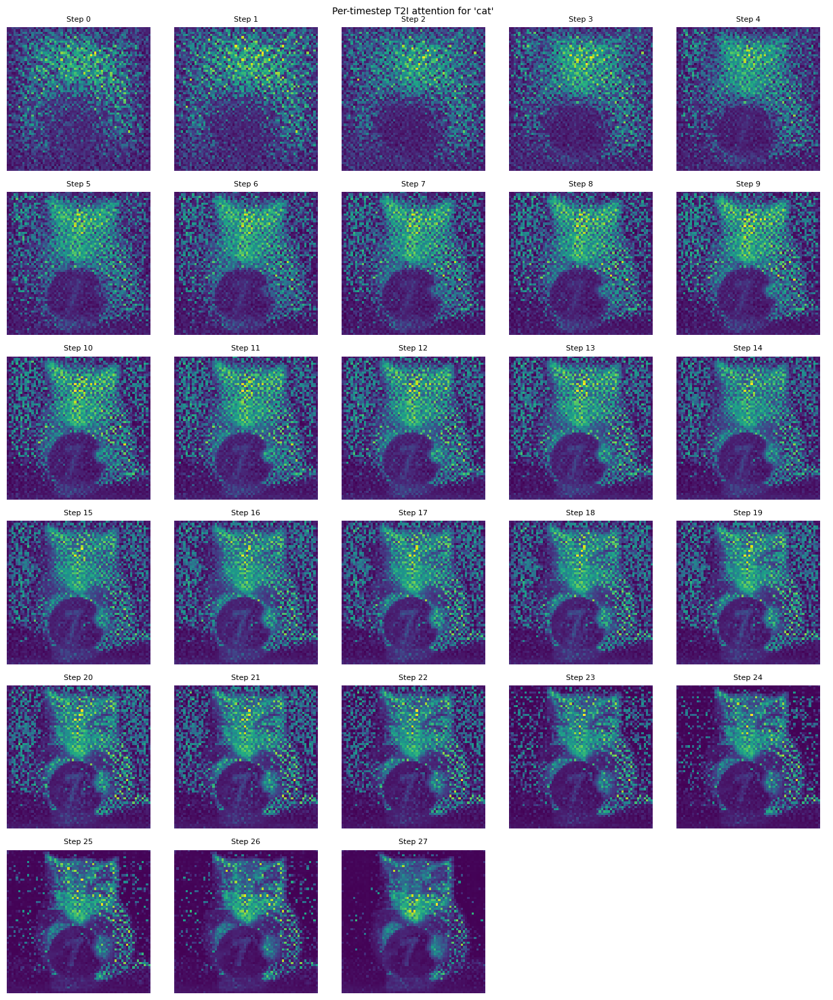

In [20]:
# Note: Flux has 57 blocks total (19 dual + 38 single, vs 24 for SD3)
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="T2I",
    image_size=(height, width),
)

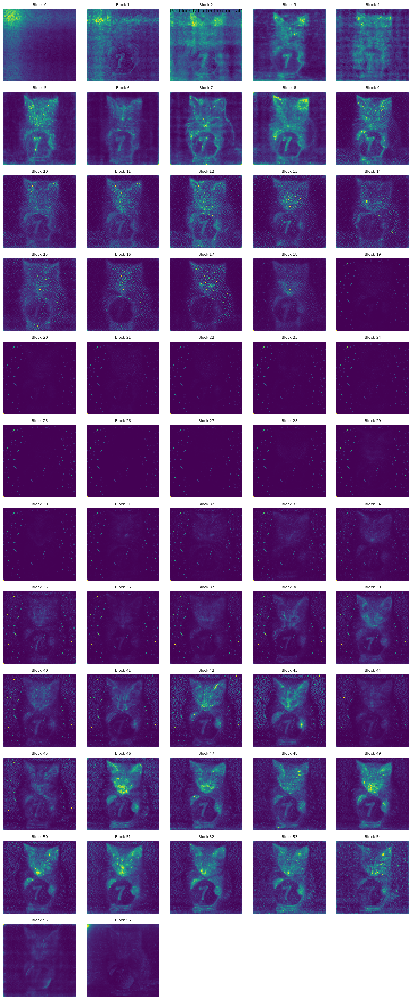

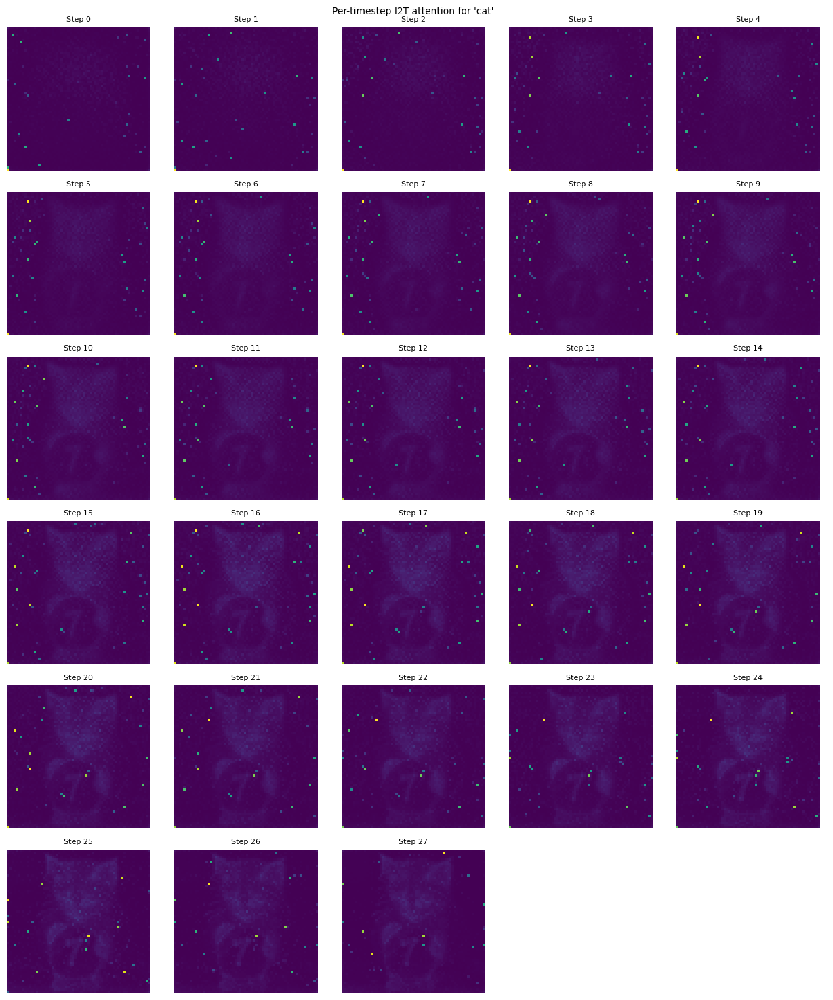

In [21]:
fig_blocks, fig_steps = visualize_attention_grid(
    inspector, viz_word, region="I2T",
    image_size=(height, width),
)

In [ ]:
del pipe, inspector
torch.cuda.empty_cache()